# Uporządkowany notebook zawierający preprocessing, funkcje oceniające modele oraz (na końcu) przekształcenia zbioru testowego

## Dostosowanie zbioru treningowego do testowego

In [246]:
df = read.csv("Model_decyzyjny_zbiór_treningowy.csv", header=TRUE)

In [247]:
head(df)

calculation_id,calculation_token,etx_make_name,etx_model_name,etx_fuel_code,production_year,etx_model_code,vehicle_id,protection_scope,kind,...,dont_have_this_car__c,TotalCarCollection__c,COpportunity_Products__r.Product_Type__c,COpportunity_Products__r.SalesChannel__c,COpportunity_Products__r.Status__c,Sale.success,Last.call,CC.sales,Telehub,Contacted.by.CC
1847410,Fc5o2b,RENAULT,Megane,100001,1997,8191,7045,1,car,...,false,0,,,,0,0,0,0,0
1847426,bpEoxI,OPEL,Astra,100001,2008,12842,66812,1,car,...,false,0,,,,0,0,0,0,0
1847453,dRXV5F,MAZDA,323,100001,1996,7884,34707,1,car,...,false,0,,,,0,0,0,0,0
1847456,eRdBt1,AUDI,Q7,100003,2007,12113,60275,2,car,...,false,0,,,,0,0,0,0,0
1847478,ZWLyxM,VOLKSWAGEN,Passat,100003,2001,10533,41583,1,car,...,false,0,,,,0,0,0,0,0
1847487,rCzLgy,PEUGEOT,406,100003,2000,9674,36042,1,car,...,false,0,,,,0,0,0,0,0


In [248]:
train = df[, c(1:69, 155)]
#train = df[, c(1:69, 147, 151, 155)]

In [249]:
colnames(train)

[1] "calculation_id"                  "calculation_token"              
 [3] "etx_make_name"                   "etx_model_name"                 
 [5] "etx_fuel_code"                   "production_year"                
 [7] "etx_model_code"                  "vehicle_id"                     
 [9] "protection_scope"                "kind"                           
[11] "usage_type"                      "use_frequency"                  
[13] "child_carriage_frequency"        "mileage"                        
[15] "yearly_mileage"                  "used_abroad"                    
[17] "night_parking_place"             "night_parking_place_postal_code"
[19] "day_parking_place"               "day_parking_place_postal_code"  
[21] "theft_protection_installation"   "theft_protection_device_1"      
[23] "theft_protection_device_2"       "origin"                         
[25] "buy_year"                        "registration_date"              
[27] "is_damaged"                      "leasing"                        
[29] "car_worth"                       "main_driver_postal_code"        
[31] "main_driver_age"                 "main_driver_gender"             
[33] "insurance_start_date"            "phone_exists"                   
[35] "calc_complete"                   "calc_incomplete"                
[37] "calc_finished"                   "phone_yes"                      
[39] "phone_no"                        "calculation_type"               
[41] "terms_acceptance"                "phone_acceptance"               
[43] "phone_accepted"                  "step"                           
[45] "created_at"                      "created_at_date"                
[47] "affiliation_id"                  "user_id"                        
[49] "salesforce_lead"                 "sent_to_sf"                     
[51] "sf_r_purchasing"                 "calculation_state"              
[53] "oc_offers_qty"                   "oc_offer_min_val"               
[55] "ac_offers_qty"                   "ac_offer_min_val"               
[57] "b2c_leads_sent"                  "form_finished_at"               
[59] "offer_first_at"                  "offer_last_at"                  
[61] "offer_first_after"               "offer_last_after"               
[63] "ga_client_id"                    "phone_lookup_status"            
[65] "utm_campaign"                    "utm_content"                    
[67] "utm_medium"                      "utm_source"                     
[69] "pkb_transform_ver"               "TotalCarCollection__c"          
[71] "Sale.success"                    "Contacted.by.CC"

In [250]:
ncol(train)

[1] 72

In [251]:
labelindex = which(colnames(df)=='Sale.success')

In [252]:
#to jest etykieta wlasciwa - czy sprzedaz sie udala?
labelindex

[1] 151

## usuwanie identyfikatorów

In [253]:
colnames(train)[grepl(".*id.*", colnames(train), ignore.case = T)]

[1] "calculation_id" "vehicle_id"     "affiliation_id" "user_id"       
[5] "ga_client_id"

In [254]:
ids = which(grepl(".*id.*",colnames(train),ignore.case=T))

In [255]:
#identyfikatory, do usuniecia
ids

[1]  1  8 47 48 63

In [256]:
colnames(train)[ids]

[1] "calculation_id" "vehicle_id"     "affiliation_id" "user_id"       
[5] "ga_client_id"

In [257]:
#token kalkulacji nie jest potrzebny
calctokenid = which(colnames(train)=='calculation_token')

In [258]:
calctokenid

[1] 2

In [259]:
ids = c(ids, calctokenid)

In [260]:
ids

[1]  1  8 47 48 63  2

In [261]:
#te predyktory powyzej do usuniecia, zatem usuwam
train2 = train[,-ids]

In [262]:
ncol(train2)

[1] 66

## Zamiana integer -> factor

In [263]:
#te kolumny są numeryczne, a wczytane zostały jako character, zatem zamiana

In [264]:
sapply(train2,class)

etx_make_name                  etx_model_name 
                       "factor"                        "factor" 
                  etx_fuel_code                 production_year 
                      "integer"                       "integer" 
                 etx_model_code                protection_scope 
                      "integer"                       "integer" 
                           kind                      usage_type 
                       "factor"                        "factor" 
                  use_frequency        child_carriage_frequency 
                       "factor"                       "integer" 
                        mileage                  yearly_mileage 
                      "integer"                       "integer" 
                    used_abroad             night_parking_place 
                      "integer"                        "factor" 
night_parking_place_postal_code               day_parking_place 
                       "factor"                        "factor" 
  day_parking_place_postal_code   theft_protection_installation 
                       "factor"                       "integer" 
      theft_protection_device_1       theft_protection_device_2 
                      "integer"                       "integer" 
                         origin                        buy_year 
                       "factor"                       "integer" 
              registration_date                      is_damaged 
                       "factor"                       "integer" 
                        leasing                       car_worth 
                      "integer"                       "integer" 
        main_driver_postal_code                 main_driver_age 
                       "factor"                       "integer" 
             main_driver_gender            insurance_start_date 
                       "factor"                        "factor" 
                   phone_exists                   calc_complete 
                       "factor"                       "integer" 
                calc_incomplete                   calc_finished 
                      "integer"                       "integer" 
                      phone_yes                        phone_no 
                      "integer"                       "integer" 
               calculation_type                terms_acceptance 
                       "factor"                       "integer" 
               phone_acceptance                  phone_accepted 
                      "integer"                       "integer" 
                           step                      created_at 
                      "integer"                        "factor" 
                created_at_date                 salesforce_lead 
                       "factor"                        "factor" 
                     sent_to_sf                 sf_r_purchasing 
                      "integer"                       "integer" 
              calculation_state                   oc_offers_qty 
                       "factor"                       "integer" 
               oc_offer_min_val                   ac_offers_qty 
                      "integer"                       "integer" 
               ac_offer_min_val                  b2c_leads_sent 
                      "integer"                       "integer" 
               form_finished_at                  offer_first_at 
                       "factor"                        "factor" 
                  offer_last_at               offer_first_after 
                       "factor"                       "integer" 
               offer_last_after             phone_lookup_status 
                      "integer"                       "integer" 
                   utm_campaign                     utm_content 
                       "factor"                        "factor" 
                     utm_medium                      utm_source 
                       "factor"                      

In [265]:
head(train2$sf_r_purchasing, 100)

[1] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [38] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [75] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [266]:
train2$etx_fuel_code = as.factor(train2$etx_fuel_code)
train2$etx_model_code = as.factor(train2$etx_model_code)
train2$protection_scope = as.factor(train2$protection_scope)
train2$hild_carriage_frequency = as.factor(train2$child_carriage_frequency)
train2$used_abroad = as.factor(train2$used_abroad)
train2$theft_protection_installation = as.factor(train2$theft_protection_installation)
train2$theft_protection_device_1 = as.factor(train2$theft_protection_device_1)
train2$theft_protection_device_2 = as.factor(train2$theft_protection_device_2)
train2$is_damaged = as.factor(train2$is_damaged)
train2$leasing = as.factor(train2$leasing)
train2$calc_complete = as.factor(train2$calc_complete)
train2$calc_finished = as.factor(train2$calc_finished)
train2$phone_yes = as.factor(train2$phone_yes)
train2$terms_acceptance = as.factor(train2$terms_acceptance)
train2$step = as.factor(train2$step)
train2$sent_to_sf = as.factor(train2$sent_to_sf)
train2$phone_lookup_status = as.factor(train2$phone_lookup_status)
train2$Sale.success = as.factor(train2$Sale.success)
train2$Contacted.by.CC = as.factor(train2$Contacted.by.CC)

## Dodanie poziomu factorów dla na

In [267]:
sapply(train2, function(col){sum(is.na(col))})

etx_make_name                  etx_model_name 
                              0                               0 
                  etx_fuel_code                 production_year 
                             19                               0 
                 etx_model_code                protection_scope 
                              0                               0 
                           kind                      usage_type 
                              0                               0 
                  use_frequency        child_carriage_frequency 
                              0                               0 
                        mileage                  yearly_mileage 
                              6                               4 
                    used_abroad             night_parking_place 
                              0                               0 
night_parking_place_postal_code               day_parking_place 
                              0                               0 
  day_parking_place_postal_code   theft_protection_installation 
                              0                               4 
      theft_protection_device_1       theft_protection_device_2 
                              0                               0 
                         origin                        buy_year 
                              0                               5 
              registration_date                      is_damaged 
                              0                               0 
                        leasing                       car_worth 
                              0                            5430 
        main_driver_postal_code                 main_driver_age 
                              0                               0 
             main_driver_gender            insurance_start_date 
                              0                               0 
                   phone_exists                   calc_complete 
                              0                               0 
                calc_incomplete                   calc_finished 
                              0                               0 
                      phone_yes                        phone_no 
                              0                               0 
               calculation_type                terms_acceptance 
                              0                               0 
               phone_acceptance                  phone_accepted 
                              0                               0 
                           step                      created_at 
                              0                               0 
                created_at_date                 salesforce_lead 
                              0                               0 
                     sent_to_sf                 sf_r_purchasing 
                              0                               0 
              calculation_state                   oc_offers_qty 
                              0                             314 
               oc_offer_min_val                   ac_offers_qty 
                              0                           22921 
               ac_offer_min_val                  b2c_leads_sent 
                             14                           10297 
               form_finished_at                  offer_first_at 
                              0                               0 
                  offer_last_at               offer_first_after 
                              0                               0 
               offer_last_after             phone_lookup_status 
                              0                               0 
                   utm_campaign                     utm_content 
                              0                               0 
                     utm_medium                      utm_source 
                              0                      

In [268]:
for (i in 1:length(train2)) {
  if (is.factor(train2[,i])){
      train2[,i] = addNA(train2[,i])
  }
}

## Usuwanie predyktorów z wariancją bliską zero (czyli takich co mają przeważnie jedną wartość lub jedna wartość jest drastycznie częsta)

In [269]:
if (!require("caret")){
    install.packages("caret")
}
library("caret")

In [270]:
nzv = nearZeroVar(train2,freqCut=99) #bardzo duży cutoff - 99/1 (by nie obcinać zbyt dużo)

In [271]:
colnames(train2)[nzv]

[1] "usage_type"            "is_damaged"            "leasing"              
 [4] "calc_complete"         "calc_incomplete"       "calc_finished"        
 [7] "calculation_type"      "terms_acceptance"      "sent_to_sf"           
[10] "sf_r_purchasing"       "calculation_state"     "ac_offer_min_val"     
[13] "pkb_transform_ver"     "TotalCarCollection__c"

In [272]:
train3 = train2[,-nzv]
#od razu mniej predyktorów:
ncol(train3)

[1] 53

In [273]:
sapply(train3,class)

etx_make_name                  etx_model_name 
                       "factor"                        "factor" 
                  etx_fuel_code                 production_year 
                       "factor"                       "integer" 
                 etx_model_code                protection_scope 
                       "factor"                        "factor" 
                           kind                   use_frequency 
                       "factor"                        "factor" 
       child_carriage_frequency                         mileage 
                      "integer"                       "integer" 
                 yearly_mileage                     used_abroad 
                      "integer"                        "factor" 
            night_parking_place night_parking_place_postal_code 
                       "factor"                        "factor" 
              day_parking_place   day_parking_place_postal_code 
                       "factor"                        "factor" 
  theft_protection_installation       theft_protection_device_1 
                       "factor"                        "factor" 
      theft_protection_device_2                          origin 
                       "factor"                        "factor" 
                       buy_year               registration_date 
                      "integer"                        "factor" 
                      car_worth         main_driver_postal_code 
                      "integer"                        "factor" 
                main_driver_age              main_driver_gender 
                      "integer"                        "factor" 
           insurance_start_date                    phone_exists 
                       "factor"                        "factor" 
                      phone_yes                        phone_no 
                       "factor"                       "integer" 
               phone_acceptance                  phone_accepted 
                      "integer"                       "integer" 
                           step                      created_at 
                       "factor"                        "factor" 
                created_at_date                 salesforce_lead 
                       "factor"                        "factor" 
                  oc_offers_qty                oc_offer_min_val 
                      "integer"                       "integer" 
                  ac_offers_qty                  b2c_leads_sent 
                      "integer"                       "integer" 
               form_finished_at                  offer_first_at 
                       "factor"                        "factor" 
                  offer_last_at               offer_first_after 
                       "factor"                       "integer" 
               offer_last_after             phone_lookup_status 
                      "integer"                        "factor" 
                   utm_campaign                     utm_content 
                       "factor"                        "factor" 
                     utm_medium                      utm_source 
                       "factor"                        "factor" 
                   Sale.success                 Contacted.by.CC 
                       "factor"                        "factor" 
        hild_carriage_frequency 
                       "factor"

## Imputacja numerycznych faktorów

In [274]:
numericpreds = which(sapply(train3,class)=='integer')
numericpreds

production_year child_carriage_frequency                  mileage 
                       4                        9                       10 
          yearly_mileage                 buy_year                car_worth 
                      11                       21                       23 
         main_driver_age                 phone_no         phone_acceptance 
                      25                       30                       31 
          phone_accepted            oc_offers_qty         oc_offer_min_val 
                      32                       37                       38 
           ac_offers_qty           b2c_leads_sent        offer_first_after 
                      39                       40                       44 
        offer_last_after 
                      45

### Numeryczne atrybuty bez NA, poszukam takich:

In [275]:
has_NA = sapply(numericpreds,function(npred)any(is.na(train3[,npred])))
has_NA

production_year child_carriage_frequency                  mileage 
                   FALSE                    FALSE                     TRUE 
          yearly_mileage                 buy_year                car_worth 
                    TRUE                     TRUE                     TRUE 
         main_driver_age                 phone_no         phone_acceptance 
                   FALSE                    FALSE                    FALSE 
          phone_accepted            oc_offers_qty         oc_offer_min_val 
                   FALSE                     TRUE                    FALSE 
           ac_offers_qty           b2c_leads_sent        offer_first_after 
                    TRUE                     TRUE                    FALSE 
        offer_last_after 
                   FALSE

In [276]:
numericpreds = numericpreds[has_NA]
numericpreds
numericpreds_keep_to_test = numericpreds

mileage yearly_mileage       buy_year      car_worth  oc_offers_qty 
            10             11             21             23             37 
 ac_offers_qty b2c_leads_sent 
            39             40

Jest ich na tyle mało, że imputacja może być ręczna

In [277]:
#sprawdzam frakcję brakujących danych
sapply(train3[,numericpreds],function(x){mean(is.na(x))})

mileage yearly_mileage       buy_year      car_worth  oc_offers_qty 
  3.801631e-05   2.534421e-05   3.168026e-05   3.440476e-02   1.989520e-03 
 ac_offers_qty b2c_leads_sent 
  1.452286e-01   6.524232e-02

In [278]:
#kilka predyktorów ma dużo brakujących danych - trzeba będzie potem pomyśleć co z tym można zrobić

In [279]:
length(numericpreds)

[1] 7

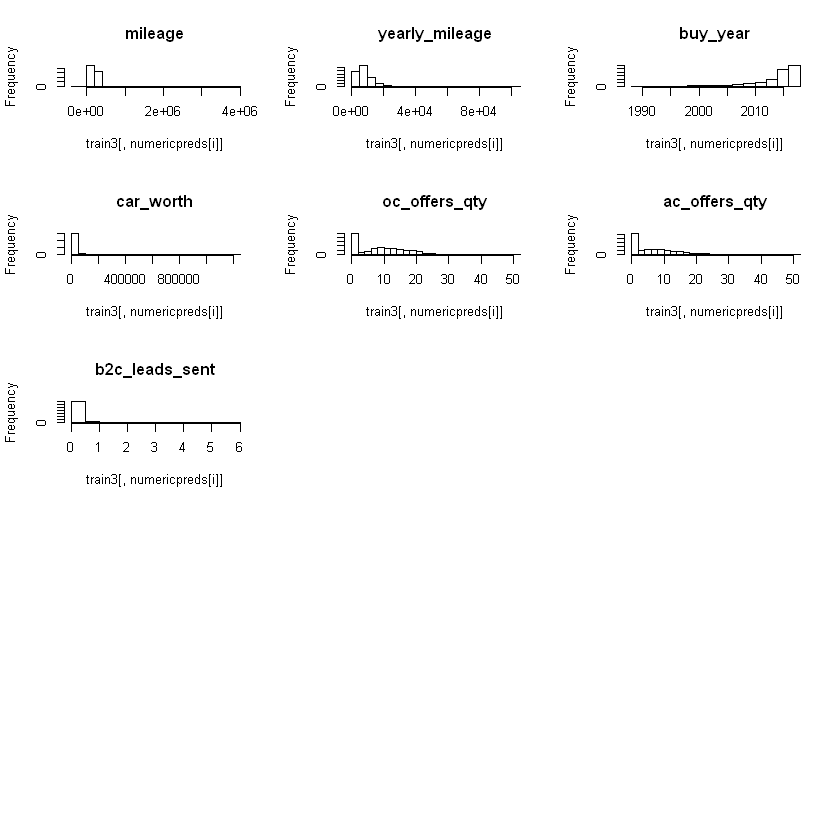

In [280]:
#rozkład wartości w predyktorach
par(mfrow=c(5,3))
for (i in 1:length(numericpreds)){
    hist(train3[,numericpreds[i]],main=colnames(train3)[numericpreds[i]])
}

Imputacja brakujących danych przez średnie (inne metody są niewykonalne w skończonym czasie)

In [281]:
for (numericpred in numericpreds){
    train3[which(is.na(train3[,numericpred])),numericpred] = as.integer(mean(na.omit(train3[,numericpred])))
}

In [282]:
#nie ma już żadnych brakujących wartości
any(sapply(train3,function(x)any(is.na(x))))

[1] FALSE

## Korelacje

In [283]:
#korelacja nie dziala dla factorow - sprawdzam zatem tylko dla ilosciowych
numerics = which(sapply(train3,class)%in%c('numeric','integer'))
cr = cor(train3[,numerics])

In [284]:
correlated = findCorrelation(cr,cutoff= 0.8,names=TRUE)

In [285]:
correlated

[1] "phone_acceptance" "phone_accepted"   "oc_offers_qty"

In [286]:
traininds = sapply(correlated,function(cc)which(colnames(train3)==cc))

In [287]:
train4 = train3[,-traininds]

In [288]:
ncol(train4)

[1] 50

## Współliniowość

In [289]:
#podobnie jak wczesniej, znowu dla ilosciowych tylko
numerics = which(sapply(train4,class)%in%c('numeric','integer'))

In [290]:
numerics

[1]  4  9 10 11 21 23 25 30 35 36 37 41 42

In [291]:
combos = findLinearCombos(train4[,numerics])

In [292]:
combos

ERROR while rich displaying an object: Error in vapply(seq_along(mapped), function(i) {: values must be length 1,
 but FUN(X[[2]]) result is length 0

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. mime2repr[[mime]](obj)
8. repr_html.list(obj)
9. repr_list_generic(obj, "html", "\t<li>%s</li>\n", "\t<dt>$%s</dt>\n\t\t<dd>%s</dd>\n", 
 .     "<strong>$%s</strong> = %s", "<ol>\n%s</ol>\n", "<dl>\n%s</dl>\n", 
 .     numeric_item = "\t<dt>[[%s]]</dt>\n\t\

$linearCombos
list()

$remove
NULL


Korelacja usunęła współliniowości.

## Zamiana kodów pocztowych na rejon

### Funkcja

In [293]:
postalCodeToRegion = function (vector){
    vector = as.character(vector)
    codes = sapply(vector,function(v){
        if (is.na(v) | (substr(v,3,3) != '-') | (nchar(v) != 6)){
            NA
        } else {
            aa = substr(v,1,2)
            a = substr(aa,1,1)
            if (a == '0'){
                if (aa %in% c('00','01','02','03','04','05')){
                    'Warsaw'
                } else {
                    'Warsaw Region'
                }
            }else if (a == '1'){
                if (aa == '10'){
                    'Olsztyn'
                } else if (aa=='15'){
                    'Bialystok'
                } else {
                    'Olsztyn Region'
                }
            }else if (a == '2'){
                if (aa == '20'){
                    'Lublin'
                } else if (aa=='25'){
                    'Kielce'
                } else if (aa=='26'){
                    'Radom'
                } else {
                    'Lublin Region'
                }
            }else if (a == '3'){
                if (aa %in% c('30','31')){
                    'Krakow'
                } else if (aa=='35'){
                    'Rzeszow'
                } else {
                    'Krakow Region'
                }
            }else if (a == '4'){
                if (aa =='40'){
                    'Katowice'
                } else if (aa=='45'){
                    'Opole'
                } else {
                    'Katowice Region'
                }
            }else if (a == '5'){
                if (aa %in% c('50','51','52','53','54')){
                    'Wroclaw'
                } else {
                    'Wroclaw Region'
                }
            }else if (a == '6'){
                if (aa %in% c('60','61')){
                    'Poznan'
                } else if (aa=='65'){
                    'Zielona Gora'
                } else {
                    'Poznan Region'
                }
            }else if (a == '7'){
                if (aa %in% c('70','71')){
                    'Szczecin'
                } else if (aa=='75'){
                    'Koszalin'
                } else {
                    'Szczecin Region'
                }
            }else if (a == '8'){
                if (aa=='80'){
                    'Gdansk'
                } else if (aa=='81'){
                    'Gdynia'
                } else if (aa=='87'){
                    'Torun'
                }  else if (aa=='85'){
                    'Bydgoszcz'
                } else {
                    'Gdansk Region'
                }
            }else if (a == '9'){
                if (aa %in% c('90','91','92','93','94')){
                    'Lodz'
                } else {
                    'Lodz Region'
                }
            }else {NA}
        }
    })
    fcodes = as.factor(codes)
    fcodes = addNA(fcodes)
    fcodes
}

In [294]:
#unit test
(fac = postalCodeToRegion(c('87-165','00-849','44-123',NA)))
class(fac)
levels(fac)

87-165          00-849          44-123            <NA> 
          Torun          Warsaw Katowice Region            <NA> 
Levels: Katowice Region Torun Warsaw <NA>

[1] "factor"

[1] "Katowice Region" "Torun"           "Warsaw"          NA

In [295]:
#kodami pocztowymi są:
#night_parking_place_postal_code
#day_parking_place_postal_code
#main_driver_postal_code

train4$night_parking_place_postal_code = postalCodeToRegion (train4$night_parking_place_postal_code)
train4$day_parking_place_postal_code = postalCodeToRegion (train4$day_parking_place_postal_code)
train4$main_driver_postal_code = postalCodeToRegion (train4$main_driver_postal_code)

In [296]:
class(train4$night_parking_place_postal_code)
class(train4$day_parking_place_postal_code)
class(train4$main_driver_postal_code)

[1] "factor"

[1] "factor"

[1] "factor"

In [297]:
head(train4$night_parking_place_postal_code)
head(train4$day_parking_place_postal_code)
head(train4$main_driver_postal_code)

[1] Poznan Region   Szczecin        Poznan Region   Poznan Region  
[5] Katowice Region Warsaw         
31 Levels: Bialystok Bydgoszcz Gdansk Gdansk Region Gdynia ... <NA>

[1] Poznan Region   Szczecin        Poznan Region   Poznan Region  
[5] Katowice Region Warsaw         
31 Levels: Bialystok Bydgoszcz Gdansk Gdansk Region Gdynia ... <NA>

[1] Poznan Region   Szczecin        Poznan Region   Poznan Region  
[5] Katowice Region Warsaw         
31 Levels: Bialystok Bydgoszcz Gdansk Gdansk Region Gdynia ... <NA>

## Daty na year,month,day

Nie trzeba zamieniać dat na year, month, day. Daty albo zostały usunięte wcześniej, albo zamienione na numeric (domyślnie najwidoczniej przez read.table).

In [298]:
colnames(train4)

[1] "etx_make_name"                   "etx_model_name"                 
 [3] "etx_fuel_code"                   "production_year"                
 [5] "etx_model_code"                  "protection_scope"               
 [7] "kind"                            "use_frequency"                  
 [9] "child_carriage_frequency"        "mileage"                        
[11] "yearly_mileage"                  "used_abroad"                    
[13] "night_parking_place"             "night_parking_place_postal_code"
[15] "day_parking_place"               "day_parking_place_postal_code"  
[17] "theft_protection_installation"   "theft_protection_device_1"      
[19] "theft_protection_device_2"       "origin"                         
[21] "buy_year"                        "registration_date"              
[23] "car_worth"                       "main_driver_postal_code"        
[25] "main_driver_age"                 "main_driver_gender"             
[27] "insurance_start_date"            "phone_exists"                   
[29] "phone_yes"                       "phone_no"                       
[31] "step"                            "created_at"                     
[33] "created_at_date"                 "salesforce_lead"                
[35] "oc_offer_min_val"                "ac_offers_qty"                  
[37] "b2c_leads_sent"                  "form_finished_at"               
[39] "offer_first_at"                  "offer_last_at"                  
[41] "offer_first_after"               "offer_last_after"               
[43] "phone_lookup_status"             "utm_campaign"                   
[45] "utm_content"                     "utm_medium"                     
[47] "utm_source"                      "Sale.success"                   
[49] "Contacted.by.CC"                 "hild_carriage_frequency"

## Propozycja radzenia sobie z markami pojazdów i innymi factorami

In [299]:
#wybieranie pierwszej części stringa określającego markę, zbije trochę liczbę poziomów

length(unique(sapply(as.character(levels(train4$etx_model_name)),function(model){
    strsplit(model,' ')[[1]][1]
})))
length(levels(train4$etx_model_name))

[1] 697

[1] 763

In [300]:
etxmodel = sapply(as.character(train4$etx_model_name),function(model){
    strsplit(model,' ')[[1]][1]
})
head(etxmodel)

Megane    Astra      323       Q7   Passat      406 
"Megane"  "Astra"    "323"     "Q7" "Passat"    "406"

In [301]:
etxmodel = as.factor(etxmodel)
#etxmodel = addNA(etxmodel)

In [302]:
any(is.na(etxmodel))

[1] FALSE

In [303]:
library(Matrix)

In [304]:
mdtrain4 = sparse.model.matrix(Sale.success~.,train4)

In [305]:
colnames(train4)

[1] "etx_make_name"                   "etx_model_name"                 
 [3] "etx_fuel_code"                   "production_year"                
 [5] "etx_model_code"                  "protection_scope"               
 [7] "kind"                            "use_frequency"                  
 [9] "child_carriage_frequency"        "mileage"                        
[11] "yearly_mileage"                  "used_abroad"                    
[13] "night_parking_place"             "night_parking_place_postal_code"
[15] "day_parking_place"               "day_parking_place_postal_code"  
[17] "theft_protection_installation"   "theft_protection_device_1"      
[19] "theft_protection_device_2"       "origin"                         
[21] "buy_year"                        "registration_date"              
[23] "car_worth"                       "main_driver_postal_code"        
[25] "main_driver_age"                 "main_driver_gender"             
[27] "insurance_start_date"            "phone_exists"                   
[29] "phone_yes"                       "phone_no"                       
[31] "step"                            "created_at"                     
[33] "created_at_date"                 "salesforce_lead"                
[35] "oc_offer_min_val"                "ac_offers_qty"                  
[37] "b2c_leads_sent"                  "form_finished_at"               
[39] "offer_first_at"                  "offer_last_at"                  
[41] "offer_first_after"               "offer_last_after"               
[43] "phone_lookup_status"             "utm_campaign"                   
[45] "utm_content"                     "utm_medium"                     
[47] "utm_source"                      "Sale.success"                   
[49] "Contacted.by.CC"                 "hild_carriage_frequency"

In [306]:
head(train4$created_at_date)

[1] 23-Feb-2017 23-Feb-2017 23-Feb-2017 23-Feb-2017 23-Feb-2017 23-Feb-2017
190 Levels: 1-Apr-2017 1-Aug-2017 1-Jul-2017 1-Jun-2017 ... <NA>

## W tym momencie - przerobione dane treningowe są w zmiennej train4, etykieta to Sale.success

### Podejście 3 - przekształcenia kolumn (ozn. train4m)

In [307]:
train4m = train4

In [308]:
train4m$timeWaiting = (train4m$offer_last_after)-(train4m$offer_first_after)

In [309]:
head(train4m$timeWaiting)

[1]  0  0  0 18 17 31

In [310]:
#czas wypelniania ankiety

In [311]:
#formFillingTime = (train$form_finished_at)-(train$created_at)
#train4m$formFillingTime = formFillingTime

In [312]:
#imputacja
#train4m$formFillingTime[is.na(formFillingTime)] = mean(train4m$formFillingTime[!is.na(formFillingTime)])

In [313]:
head(train4m)

etx_make_name,etx_model_name,etx_fuel_code,production_year,etx_model_code,protection_scope,kind,use_frequency,child_carriage_frequency,mileage,...,offer_last_after,phone_lookup_status,utm_campaign,utm_content,utm_medium,utm_source,Sale.success,Contacted.by.CC,hild_carriage_frequency,timeWaiting
RENAULT,Megane,100001,1997,8191,1,car,regularly,3,200000,...,0,0,,,,,0,0,3,0
OPEL,Astra,100001,2008,12842,1,car,regularly,3,137000,...,0,0,,,,,0,0,3,0
MAZDA,323,100001,1996,7884,1,car,occasionally,3,160000,...,0,0,,,,,0,0,3,0
AUDI,Q7,100003,2007,12113,2,car,regularly,3,262000,...,30,2,mfind,adwords,cpc,google,0,0,3,18
VOLKSWAGEN,Passat,100003,2001,10533,1,car,occasionally,3,250000,...,25,2,mfind,,email,koniecoc_wm,0,0,3,17
PEUGEOT,406,100003,2000,9674,1,car,regularly,3,290000,...,38,1,,,,,0,0,3,31


In [314]:
mdtrain4m = sparse.model.matrix(Sale.success~.,train4m)

In [315]:
dim(train4m)
dim(mdtrain4m)

[1] 157827     51

[1] 157827 696445

In [316]:
dim(mdtrain4m)
dim(mdtrain4)

[1] 157827 696445

[1] 157827 696444

### Train4 z obniżonymi levelami factorów (ozn. train4l)

In [317]:
sapply(train4,function(l)length(levels(l)))

etx_make_name                  etx_model_name 
                             70                             763 
                  etx_fuel_code                 production_year 
                              6                               0 
                 etx_model_code                protection_scope 
                           2863                               3 
                           kind                   use_frequency 
                              3                               3 
       child_carriage_frequency                         mileage 
                              0                               0 
                 yearly_mileage                     used_abroad 
                              0                              14 
            night_parking_place night_parking_place_postal_code 
                              8                              31 
              day_parking_place   day_parking_place_postal_code 
                              8                              31 
  theft_protection_installation       theft_protection_device_1 
                              5                               5 
      theft_protection_device_2                          origin 
                              6                               6 
                       buy_year               registration_date 
                              0                             367 
                      car_worth         main_driver_postal_code 
                              0                              31 
                main_driver_age              main_driver_gender 
                              0                               4 
           insurance_start_date                    phone_exists 
                            370                               3 
                      phone_yes                        phone_no 
                              3                               0 
                           step                      created_at 
                              3                          156594 
                created_at_date                 salesforce_lead 
                            190                          157813 
               oc_offer_min_val                   ac_offers_qty 
                              0                               0 
                 b2c_leads_sent                form_finished_at 
                              0                          156610 
                 offer_first_at                   offer_last_at 
                         109909                          109851 
              offer_first_after                offer_last_after 
                              0                               0 
            phone_lookup_status                    utm_campaign 
                              4                             153 
                    utm_content                      utm_medium 
                            570                              58 
                     utm_source                    Sale.success 
                            101                               3 
                Contacted.by.CC         hild_carriage_frequency 
                              3                               4

In [318]:
#upraszczanie factorów Mpc__c

In [319]:
train4l = train4

In [320]:
train4l$Mpc__c = as.factor(tolower(train4l$Mpc__c))
train4l$Mpc__c = addNA(train4l$Mpc__c)

ERROR: Error in `$<-.data.frame`(`*tmp*`, Mpc__c, value = structure(integer(0), .Label = character(0), class = "factor")): replacement has 0 rows, data has 157827


In [ ]:
utm_campaign = sapply(train4$utm_campaign, function(u){
    u = tolower(as.character(u))
    if (is.na(u)){NA}else if 
        (regexpr('mailing',u,ignore.case=T)>0) {"mailing"} else if 
        (regexpr('kalkulator',u,ignore.case=T)>0){"kalkulator"} else if 
        (regexpr('baner',u,ignore.case=T)>0){"baner"}  else if 
        (regexpr('sprzedany',u,ignore.case=T)>0){"sprzedany"} else
            {u}
})

utm_campaign = as.factor(utm_campaign)
utm_campaign = addNA(utm_campaign)
train4l$utm_campaign = utm_campaign

In [ ]:
utm_content = sapply(train4$utm_content, function(u){
    u = tolower(as.character(u))
    if (is.na(u)){NA}else if 
        (regexpr('OC',u,ignore.case=T)>0) {"OC"} else if 
        (regexpr('button',u,ignore.case=T)>0){"button"} else
            {u}
})

utm_content = as.factor(utm_content)
utm_content = addNA(utm_content)
train4l$utm_content = utm_content

In [ ]:
utm_medium = sapply(train4$utm_medium, function(u){
    u = tolower(as.character(u))
    if (is.na(u)){NA}else if 
        (regexpr('baner',u,ignore.case=T)>0) {"baner"} else if 
        (regexpr('banner',u,ignore.case=T)>0){"baner"} else if 
        (regexpr('link',u,ignore.case=T)>0){"link"} else
            {u}
})

utm_medium = as.factor(utm_medium)
utm_medium = addNA(utm_medium)
train4l$utm_medium = utm_medium

In [ ]:
salutation = sapply(train4$Account__r.Salutation, function(u){
    u = tolower(as.character(u))
    if (is.na(u)){NA}else if 
        (regexpr('ms.',u,ignore.case=T)==1) {"pani"} else if 
        (regexpr('mr.',u,ignore.case=T)==1){"pan"} else if 
        (regexpr('brak',u,ignore.case=T)==1){NA} else
            {u}
})

salutation = as.factor(salutation)
salutation = addNA(salutation)
train4l$Account__r.Salutation = salutation

In [ ]:
utm_source = sapply(train4$utm_source, function(u){
    u = tolower(as.character(u))
    if (is.na(u)){NA}else if 
        (regexpr('forum',u,ignore.case=T)>0) {"forum"} else if 
        (regexpr('cc',u,ignore.case=T)>0){"cc"}  else
            {u}
})

utm_source = as.factor(utm_source)
utm_source = addNA(utm_source)
train4l$utm_source = utm_source

In [ ]:
mdtrain4l = sparse.model.matrix(Sale.success~.,train4l)

In [ ]:
dim(mdtrain4l)
dim(mdtrain4)

### Podejście 5 - lowfactors+modified (ozn train4ml)

In [ ]:
train4ml = train4l
train4ml$contactDifference=train4m$contactDifference
train4ml$timeWaiting=train4m$timeWaiting
train4ml$hurryTime=train4m$hurryTime
train4ml$formFillingTime = train4m$formFillingTime
train4ml$is_damaged = as.factor(train$is_damaged)
mdtrain4ml = sparse.model.matrix(Sale.success~.,train4ml)

### Podejście 6 - dodanie informacji o OC/AC (ozn train4eml)

Obecnie najlepsze

In [ ]:
train4eml = train4ml

In [ ]:
train4eml$oc_offer_min_val = train$oc_offer_min_val
train4eml$ac_offer_min_val = train$ac_offer_min_val
train4eml$oc_offers_qty = train$oc_offers_qty
train4eml$oc_offers_qty[is.na(train4eml$oc_offers_qty)] = 0
train4eml$ac_offers_qty = train$ac_offers_qty
train4eml$ac_offers_qty[is.na(train4eml$ac_offers_qty)] = 0

train4eml$ocacqty = train4eml$oc_offers_qty + train4eml$ac_offers_qty
train4eml$ocacminval = train4eml$oc_offer_min_val + train4eml$ac_offer_min_val
train4eml$ocacratio = (train$oc_offer_min_val) / (train$ac_offer_min_val)
train4eml$ocacratio[train4eml$ac_offer_min_val==0] = 0

In [ ]:
any(is.na(train4eml$oc_offer_min_val))
any(is.na(train4eml$ac_offer_min_val))
any(is.na(train4eml$oc_offers_qty))
any(is.na(train4eml$ac_offers_qty))
any(is.na(train4eml$ocacqty))
any(is.na(train4eml$ocacminval))
any(is.na(train4eml$ocacratio))

In [ ]:
mdtrain4eml = sparse.model.matrix(Sale.success~.,train4eml)

In [ ]:
dim(mdtrain4eml)
dim(mdtrain4ml)

In [ ]:
train4eml2 = train4eml
train4eml2$form_finished_at = train$form_finished_at
train4eml2$form_finished_at[is.na(train4eml2$form_finished_at)] = mean(train4eml2$form_finished_at[!is.na(train4eml2$form_finished_at)])
train4eml2$created_at = train$created_at
train4eml2$offer_first_after = train$offer_first_after
train4eml2$offer_last_after = train$offer_last_after

In [ ]:
any(is.na(train4eml2$form_finished_at))
any(is.na(train4eml2$created_at))
any(is.na(train4eml2$offer_first_after))
any(is.na(train4eml2$offer_last_after))

In [ ]:
train4eml3 = train4eml2
train4eml3$lastcallDOW = as.factor((as.integer(train4eml3$LastCall__c) + 6)%%7)
train4eml3$LastCall__c = NULL
train4eml3$form_finished_at = NULL
train4eml3$offer_last_at = NULL
train4eml3$created_atDOW = as.factor((as.integer(train4eml3$created_at) + 6)%%7)
train4eml3$created_at = NULL

In [ ]:
dim(train4eml3)
dim(train4eml2)

In [ ]:
mdtrain4eml3 = sparse.model.matrix(Sale.success~.,train4eml3)

In [ ]:
mdtrain4eml2 = sparse.model.matrix(Sale.success~.,train4eml2)

# Funkcje do oceny modeli (ROC, AUC)

In [321]:
if (!require('pROC')){
    install.packages('pROC')
}
library('pROC')

In [322]:
#lib
#funkcje do rysowania ROC

tpr = function(t=0.5,pred,ty){
  predh = as.integer(pred>t)
  sum(predh[which(ty==1)])/sum(ty)
}

fpr = function(t=0.5,pred,ty){
  predh = as.integer(pred>t)
  sum(predh[-which(ty==1)])/(length(ty)-sum(ty))
}

#funkcja
drawROC = function(pred,ty,title="ROC"){
    if (is.factor(ty)){ty = as.integer(ty)} 
    t = seq(0.001,0.999,0.001)
    ty = ty[!is.na(pred)]
    pred = pred[!is.na(pred)]
    dx = sapply(t, function(tt){
    fpr(t=tt,pred,ty)
    })
    dy = sapply(t, function(tt){
    tpr(t=tt,pred,ty)
    })
    plot(dx,dy,xlim=c(0,1),ylim=c(0,1),type="l",col=1,xaxs="i",yaxs="i")
    title(main=title)
    abline(0,1,col=2)
}

ROCcoords = function(pred,ty,title="ROC"){
    if (is.factor(ty)){ty = as.integer(ty)} 
    t = seq(0.0001,0.9999,0.0001)

    dx = sapply(t, function(tt){
    fpr(t=tt,pred,ty)
    })
    dy = sapply(t, function(tt){
    tpr(t=tt,pred,ty)
    })
    return (data.frame(dx,dy))
}

library(pROC)
#usage - pROC::auc(test_y,pred)

#funkcje do lift
drawLIFT = function(pred,ty,title="LIFT"){
    if (is.factor(ty)){ty = as.integer(ty)} 
    t = 1:100
    sort_pred = order(pred,decreasing=T)
    n = length(pred)
    
    dx = 1:100

    dy = sapply(dx, function(x){
        m = as.integer((n*x)/100)
        if (m==0){
            NA
        }else{
            dct = sum(ty[head(sort_pred,m)])/sum(ty)
            dct/(x/100)
        }
    })
    
    dx = dx[!is.na(dy)]
    dy = dy[!is.na(dy)]

    plot(dx,dy,xlim=c(0,100),type="l",col=1,xaxs="i",yaxs="i")
    title(main=title)
    abline(1,0,col=2)
}

getLIFTS = function(pred,ty){
    if (is.factor(ty)){ty = as.integer(ty)} 
    t = 1:100
    sort_pred = order(pred,decreasing=T)
    n = length(pred)
    
    dx = c(5,10)

    dy = sapply(dx, function(x){
        m = as.integer((n*x)/100)
        if (m==0){
            NA
        }else{
            dct = sum(ty[head(sort_pred,m)])/sum(ty)
            dct/(x/100)
        }
    })
    
    return(data.frame(lift5=dy[1],lift10=dy[2]))
}

LIFTcoords = function(pred,ty){
    if (is.factor(ty)){ty = as.integer(ty)} 
    t = 1:100
    sort_pred = order(pred,decreasing=T)
    n = length(pred)
    
    dx = 1:100

    dy = sapply(dx, function(x){
        m = as.integer((n*x)/100)
        if (m==0){
            NA
        }else{
            dct = sum(ty[head(sort_pred,m)])/sum(ty)
            dct/(x/100)
        }
    })
    
    dx = dx[!is.na(dy)]
    dy = dy[!is.na(dy)]
    return (data.frame(dx,dy))
}

In [323]:
#hiperparametry

xgboosthiper = function (datax,datay,predictors=40,obj='binary:logistic'){
    
    n = nrow(datax)
    trx = datax
    try = datay

    xgsf = xgb.DMatrix(trx,label=try)

    #selekcja zmiennych ('predictors' most important)
    xg1=  xgboost(xgsf, nrounds=100, objective = obj,verbose=0)
    imp = xgb.importance(colnames(trx),xg1)
    sec = head(imp$Feature,predictors)
    inds = sapply(sec,function(sc)which(colnames(trx)==sc))
    ptrx = trx[,inds]

    #optymalizacja hiperparametrow
    sa = sample(1:nrow(ptrx),n/5,replace=F)
    optrx = as.matrix(ptrx[sa,])

    xgFitControl = trainControl (method="cv",number = 4) #4fold
    xgxo = optrx
    xgyo = as.factor(try[sa])
    xgModel = train(xgxo,xgyo,method = "xgbTree",trControl = xgFitControl)

    return (xgModel$bestTune)
}

In [324]:
#kombajn działający dla fold, dokonujący selekcji zmiennych na każdym foldzie i optymalizujący hiperparametry
#zwraca uśrednione AUC, LIFT5 i LIFT10

xgboostmeasure = function (datax,datay,k=10, rk=5, obj= 'binary:logistic',predictors=40){
    retdf = data.frame(AUC=rep(0,k),LIFT5=rep(0,k),LIFT10=rep(0,k))
    set.seed(997)   
    tune = list(nrounds=50,max_depth=1,eta=0.3,gamma=0,colsample_bytree=0.8,min_child_weight=1,subsample=0.75)
      
    xgsf = xgb.DMatrix(datax,label=datay)

    #selekcja zmiennych ('predictors' most important)
    xg1=  xgboost(xgsf, nrounds=100, objective = obj,verbose=0)
    imp = xgb.importance(colnames(datax),xg1)
    sec = head(imp$Feature,predictors)
    inds = sapply(sec,function(sc)which(colnames(datax)==sc))
    pdatax = datax[,inds]    
        
    set.seed(997)
        
    for (j in 1:rk){
        sequence = sample(1:nrow(datax),nrow(datax),replace=F)
        for (i in 1:k){
            n = nrow(datax)
            nf = as.integer(nrow(datax)/k)
            tf = ((i-1)*nf+1):(i*nf) #indeksy zb. testowego

            trx = pdatax[sequence[-tf],]
            try = datay[sequence[-tf]]
            tsx = pdatax[sequence[tf],]
            tsy = datay[sequence[tf]]


            #trenowanie modelu
            rtrx = xgb.DMatrix(trx,label=try)
            model =  xgboost(params= tune, data = rtrx, nrounds=tune$nrounds, 
                             objective = obj,verbose=0)

            #predykcja
            rtsx = xgb.DMatrix(tsx)
            predy = predict(model,rtsx,type="response")

            rauc = pROC::auc(tsy,predy)
            retdf[i,1] = rauc
            lifts = getLIFTS(predy,tsy)
            retdf[i,2] = lifts$lift5
            retdf[i,3] = lifts$lift10
            print(paste0("Arrange nr ",j," Fold nr ",i,", AUC ROC= ",rauc,", LIFT5= ",lifts$lift5,", LIFT10= ",lifts$lift10))
        }
    }
    return (retdf)
}

In [325]:
#coś co pozwoli zrobić dummies wszędzie
library(Matrix)
library(xgboost)
mdtrain4 = sparse.model.matrix(Sale.success~.,train4)
trainy = train4$Sale.success

## XGBoost

In [326]:
library(xgboost)
library(caret)
library(glmnet)

In [327]:
#benchmark, model 1

In [331]:
nrow(mdtrain4)
length(trainy)

[1] 157827

[1] 157827

[1] 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
   [37] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
   [73] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1
  [109] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [145] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
  [181] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 1 2 1 1 1
  [217] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2
  [253] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1
  [289] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [325] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
  [361] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 1 1 1 1
  [397] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [433] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
  [469] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [505] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [541] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [577] 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [613] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1
  [649] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [685] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1
  [721] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [757] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1
  [793] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1
  [829] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [865] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [901] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [937] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1
  [973] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1009] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1045] 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1081] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1117] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1153] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1189] 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1
 [1225] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1261] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
 [1333] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1369] 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
 [1405] 2 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1441] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1477] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1513] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 2 1
 [1549] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1
 [1585] 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1621] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1657] 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1693] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
 [1729] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1
 [1765] 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [18

In [332]:
xg4scores = xgboostmeasure(datax=mdtrain4,datay=as.numeric(trainy)-1)

[1] "Arrange nr 1 Fold nr 1, AUC ROC= 0.819877713954352, LIFT5= 5.20891364902507, LIFT10= 3.98328690807799"
[1] "Arrange nr 1 Fold nr 2, AUC ROC= 0.831437449851177, LIFT5= 5.48431105047749, LIFT10= 4.22919508867667"
[1] "Arrange nr 1 Fold nr 3, AUC ROC= 0.826696818601898, LIFT5= 5.4093567251462, LIFT10= 4.15204678362573"
[1] "Arrange nr 1 Fold nr 4, AUC ROC= 0.833648594425683, LIFT5= 5.24822695035461, LIFT10= 4.38297872340426"
[1] "Arrange nr 1 Fold nr 5, AUC ROC= 0.82459410828128, LIFT5= 5.06329113924051, LIFT10= 4.17721518987342"
[1] "Arrange nr 1 Fold nr 6, AUC ROC= 0.814888567158737, LIFT5= 4.93224932249322, LIFT10= 3.7940379403794"
[1] "Arrange nr 1 Fold nr 7, AUC ROC= 0.819728312932411, LIFT5= 5.25333333333333, LIFT10= 4.05333333333333"
[1] "Arrange nr 1 Fold nr 8, AUC ROC= 0.811508353163946, LIFT5= 5.45180722891566, LIFT10= 4.00602409638554"
[1] "Arrange nr 1 Fold nr 9, AUC ROC= 0.810997958976996, LIFT5= 5.67647058823529, LIFT10= 3.91176470588235"
[1] "Arrange nr 1 Fold nr 10, A

In [ ]:
xg4nlscores = xgboostmeasure(datax=mdtrain4nl,datay=trainy)

In [ ]:
xg4mscores = xgboostmeasure(datax=mdtrain4m,datay=trainy)

In [ ]:
xg4lscores = xgboostmeasure(datax=mdtrain4l,datay=trainy)

In [ ]:
xg4mlscores = xgboostmeasure(datax=mdtrain4ml,datay=trainy)

In [ ]:
xg4emlscores = xgboostmeasure(datax=mdtrain4eml,datay=trainy)

In [ ]:
xg4eml2scores = xgboostmeasure(datax=mdtrain4eml2,datay=trainy)

In [ ]:
xg4eml3scores = xgboostmeasure(datax=mdtrain4eml3,datay=trainy)

In [ ]:
xg4eml3scores30 = xgboostmeasure(datax=mdtrain4eml3,datay=trainy,predictors=30)

In [ ]:
xg4eml3scores60 = xgboostmeasure(datax=mdtrain4eml3,datay=trainy,predictors=60)

In [ ]:
xg4eml3scores100 = xgboostmeasure(datax=mdtrain4eml3,datay=trainy,predictors=100)

In [ ]:
xg4eml3scores50 = xgboostmeasure(datax=mdtrain4eml3,datay=trainy,predictors=50)

In [ ]:
sdf = data.frame(eml30 = xg4eml3scores30$AUC, emln = xg4eml3scores$AUC, eml50=xg4eml3scores50$AUC, eml60 = xg4eml3scores60$AUC, eml100 = xg4eml3scores100$AUC)

In [ ]:
sapply(sdf,mean)

In [ ]:
boxplot(sdf,ylim=c(0.82,0.87))

In [ ]:
bxdataframe=data.frame(T=xg4scores$AUC,F=xg4nlscores$AUC,M=xg4mscores$AUC,L=xg4lscores$AUC, ML = xg4mlscores$AUC, EML = xg4emlscores$AUC, EML2 = xg4eml2scores$AUC, EML3 = xg4eml3scores$AUC)

In [ ]:
sapply(bxdataframe,mean)

In [ ]:
boxplot(bxdataframe,ylim=c(0.82,0.87))
abline(0.5,0,col="red")

In [ ]:
bxdataframe2=data.frame(T=xg4scores$LIFT10,F=xg4nlscores$LIFT10,M=xg4mscores$LIFT10,L=xg4lscores$LIFT10, ML = xg4mlscores$LIFT10, EML = xg4emlscores$LIFT10, EML2 = xg4eml2scores$LIFT10, EML3 = xg4eml3scores$LIFT10)

In [ ]:
boxplot(bxdataframe2)